##**Implementation The TensorFlow 2 Object Detection Library for training on our own dataset**

In [ ]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3129, done.
remote: Counting objects: 100% (3129/3129), done.
remote: Compressing objects: 100% (2663/2663), done.
remote: Total 3129 (delta 786), reused 1313 (delta 422), pack-reused 0
Receiving objects: 100% (3129/3129), 33.40 MiB | 13.69 MiB/s, done.
Resolving deltas: 100% (786/786), done.


In [ ]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install . --quiet

  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
multiprocess 0.70.12.2 requires dill>=0.3.4, but you have dill 0.3.1.1 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [ ]:
#run model builder test to ensure everything is up and runnning
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

Running tests under Python 3.7.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2022-01-14 12:11:43.698024: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0114 12:11:44.050621 139829787015040 model_builder.py:1100] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 2.93s
I0114 12:11:44.296180 139829787015040 test_util.py:2309] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 2.93s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 0.5s
I0114 12:11:44.796997 139829787015040 test_

In [ ]:
#Download the Oxford-IIIT Pet dataset
!wget http://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
!wget http://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz
!tar -xf annotations.tar.gz
!tar -xf images.tar.gz

--2022-01-14 12:12:08--  http://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
Resolving www.robots.ox.ac.uk (www.robots.ox.ac.uk)... 129.67.94.2
Connecting to www.robots.ox.ac.uk (www.robots.ox.ac.uk)|129.67.94.2|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz [following]
--2022-01-14 12:12:09--  https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
Connecting to www.robots.ox.ac.uk (www.robots.ox.ac.uk)|129.67.94.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 791918971 (755M) [application/x-gzip]
Saving to: ‘images.tar.gz’

images.tar.gz       100%[===================>] 755.23M  9.54MB/s    in 67s     

2022-01-14 12:13:16 (11.3 MB/s) - ‘images.tar.gz’ saved [791918971/791918971]

--2022-01-14 12:13:16--  http://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz
Resolving www.robots.ox.ac.uk (www.robots.ox.ac.uk)... 129.67.94.2
Co

In [ ]:
#store all the required files in the workspace folder
!mkdir /content/workspace/
!mkdir /content/workspace/images/ # store images
!mkdir /content/workspace/annotations/ # store xml annotation files
!mkdir /content/workspace/images/train # train images
!mkdir /content/workspace/images/test # test images
!mkdir /content/workspace/annotations/train # train annotations
!mkdir /content/workspace/annotations/test # test annotations
!mkdir /content/workspace/data/ # directory to store the tf_records & the label_map

In [ ]:
import os
import pathlib
import logging
import re
import shutil
import glob
import pandas as pd
import xml.etree.ElementTree as ET
from tqdm import tqdm
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import tarfile
import time
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display
import numpy as np


IMAGE_DIR = "/content/images"
ANNOT_DIR = "/content/annotations/xmls"

pd.set_option("display.max_colwidth", None)
os.chdir("/content/")

%load_ext tensorboard
%load_ext autoreload
%matplotlib inline
%autoreload 2

In [ ]:
import tensorflow.compat.v1 as tf1
import contextlib2
import tensorflow as tf

from object_detection.utils import dataset_util
from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder
from object_detection.dataset_tools import tf_record_creation_util


# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

# Partition the Dataset





In [ ]:
all_images    = os.listdir(IMAGE_DIR)

#Split the images into train and test datasets
train_images, test_images = train_test_split(all_images, test_size=0.2, random_state = 123) 

#Grab the list of all the annotations for the train and test images
#Some annotations may not exist we will filter these in the next cell
train_xmls = [f.split(".")[0] + ".xml" for f in train_images]
test_xmls  = [f.split(".")[0] + ".xml" for f in test_images ]

# Create Pandas DataFrame Object

In [ ]:
all_images    = os.listdir(IMAGE_DIR)

#Split the images into train and test datasets
train_images, test_images = train_test_split(all_images, test_size=0.2, random_state = 123) 

#Grab the list of all the annotations for the train and test images
#Some annotations may not exist we will filter these in the next cell
train_xmls = [f.split(".")[0] + ".xml" for f in train_images]
test_xmls  = [f.split(".")[0] + ".xml" for f in test_images ]

In [ ]:
def move_file(fileList : list, src: str, dest: str):
    """
    This Fn copy's files from a given fileList from src to dest
    if the file exits.

    Args:
        fileList: List containing all the files present in the src directory.
        src     : source directory for the files.
        dest    : destination where to copy the files present in fileList.
    """
    for f in tqdm(fileList):
        fileName = os.path.join(src, f)
        #Check if the file exits, if the file exits copy contents from src to dest
        if os.path.exists(fileName):
            shutil.copy2(src=fileName, dst=os.path.join(dest, f))



#Move images and annotations to workspace directory
move_file(train_images, src=IMAGE_DIR, dest="/content/workspace/images/train/")
move_file(test_images,  src=IMAGE_DIR, dest="/content/workspace/images/test/")

move_file(train_xmls, src=ANNOT_DIR, dest="/content/workspace/annotations/train/")
move_file(test_xmls,  src=ANNOT_DIR, dest="/content/workspace/annotations/test/")

100%|██████████| 1479/1479 [00:00<00:00, 18227.91it/s]


In [ ]:
#from the filename.
exp = r"/([^/]+)_\d+.jpg$"
exp = re.compile(exp)

#sklearn.LabelEncoder will be used to convert the class of the object into integer format.
le  = LabelEncoder()

def xml2pandas(annot_dir):
    """
    Fn converts the xml files into a pandas dataframe.

    Args:
        annot_dir: Directory where all the *.xml annotation files are stored
    """
    xml_list = []
    for xml_file in tqdm(glob.glob(annot_dir + '/*.xml')):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (
                root.find('filename').text,
                int(root.find('size')[0].text),
                int(root.find('size')[1].text),
                member[0].text,
                int(member[4][0].text),
                int(member[4][1].text),
                int(member[4][2].text),
                int(member[4][3].text)
                )
            xml_list.append(value)
        column_name = ['filename', 'width', 'height','labels', 'xmin', 'ymin', 'xmax', 'ymax']
        xml_df = pd.DataFrame(xml_list, columns=column_name)
    logging.info("DataFrame Generated ! ")
    return xml_df


def process_data(annotDir, imageDir, image_set="train"):
    """
    Fn creates a pandas DataFrame object from the annotation in annotDir
    and images in imageDir. This Fn also extracts the name of the class from the
    filename and converts it into integer labels starting from 1 as 0 is reserved
    for the background class always.

    Args:
        annotDir  : directory where the *.xml annotation files are stored.
        imageDir  : directory where all the images are stored.
        image_set : one of either `train` or `test`, this use when converting 
                    the class objects into integer formats.
    """
    data = xml2pandas(annotDir)
    #modify the filename to point to the original filename
    data.filename = [os.path.join(imageDir, fname) for fname in data.filename.values]
    #extract the class labels from the filenames
    data["labels"] = [exp.search(data.filename[idx]).group(1).lower() for idx in range(len(data))]
    #encoded the labels into integers starting from 1
    if image_set == "train" :
        data["encoded_label"] = le.fit_transform(data.labels) + 1
    elif image_set == "test" :
        data["encoded_label"] = le.transform(data.labels) + 1
    
    return data

In [ ]:
TRAIN_IMAGE_DIR = "/content/workspace/images/train/"
TEST_IMAGE_DIR  = "/content/workspace/images/test/"
TRAIN_ANNOTATION_DIR = "/content/workspace/annotations/train/"
TEST_ANNOTATION_DIR  = "/content/workspace/annotations/test/"

#Create pandas datafame from the *.xml files
train_data = process_data(TRAIN_ANNOTATION_DIR, TRAIN_IMAGE_DIR, "train")
test_data  = process_data(TEST_ANNOTATION_DIR, TEST_IMAGE_DIR, "test")

100%|██████████| 725/725 [00:00<00:00, 725.67it/s]


In [ ]:
#Cross check for missing files
for f in train_data.filename:
    if not os.path.exists(f):
        #remove the missing file
        print(f"{f} is missing in train_data")
        train_data = train_data[train_data.filename != f]
        train_data.reset_index(inplace=True, drop=True)


for f in test_data.filename:
    if not os.path.exists(f):
        #remove the missing file
        print(f"{f} missing in test_data")
        test_data = test_data[test_data.filename != f]
        test_data.reset_index(inplace=True, drop=True)

In [ ]:
train_data.head()

,filename,width,height,labels,xmin,ymin,xmax,ymax,encoded_label
0,/content/workspace/images/train/chihuahua_107.jpg,300,225,chihuahua,31,31,104,119,11
1,/content/workspace/images/train/samoyed_129.jpg,333,500,samoyed,39,21,263,320,30
2,/content/workspace/images/train/basset_hound_159.jpg,333,500,basset_hound,23,59,209,270,4
3,/content/workspace/images/train/British_Shorthair_161.jpg,333,500,british_shorthair,51,50,294,318,10
4,/content/workspace/images/train/chihuahua_128.jpg,300,225,chihuahua,94,35,235,136,11


In [ ]:
test_data.head()

,filename,width,height,labels,xmin,ymin,xmax,ymax,encoded_label
0,/content/workspace/images/test/Birman_165.jpg,500,375,birman,116,1,431,276,7
1,/content/workspace/images/test/samoyed_136.jpg,500,375,samoyed,294,118,368,198,30
2,/content/workspace/images/test/english_cocker_spaniel_142.jpg,500,417,english_cocker_spaniel,274,83,378,168,13
3,/content/workspace/images/test/chihuahua_168.jpg,248,300,chihuahua,35,2,241,160,11
4,/content/workspace/images/test/Maine_Coon_186.jpg,327,500,maine_coon,75,17,247,198,21


# Create Label Map

In [ ]:
unique_labels  = list(train_data.labels.unique())
integer_labels = le.transform(unique_labels) + 1

label_dict = {unique_labels[i] : integer_labels[i] for i in range(len(unique_labels))}

label_map = "/content/workspace/data/label_map.pbtxt"
categories = train_data.labels.unique()
categories.sort()	

end = '\n'
s = ' '

for name in categories:
    out = ''
    out += 'item' + s + '{' + end
    out += s*2 + 'id:' + ' ' + (str(label_dict[name])) + end
    out += s*2 + 'name:' + ' ' + '\'' + name + '\'' + end
    out += '}' + end*2
    
    with open(label_map, 'a') as f:
        f.write(out)

# Create TensorFlow Records

In [ ]:
def create_tf_example(fname, data):
    """
    Creates a tf.Example proto from a single image
    from the given data

    Args:
        fname: filename of a single image from data.
        data : a pandas dataframe object in the format 
               specified in step 2. 

    Returns:
        example: The created tf.Example.
    """
    curr_data = data.loc[data.filename == fname]
    
    filename = fname.encode('utf8') # Filename of the image
    height = curr_data["height"].values[0] # Image height
    width = curr_data["width"].values[0] # Image width
    
    image_format = b'jpeg' # b'jpeg' or b'png'
    
    # List of normalized left x coordinates in bounding box (1 per box).
    xmins = list(curr_data["xmin"].values / width) 
    # List of normalized right x coordinates in bounding box (1 per box).
    xmaxs = list(curr_data["xmax"].values / width) 
    # List of normalized top y coordinates in bounding box (1 per box).
    ymins = list(curr_data["ymin"].values / height)
    # List of normalized bottom y coordinates in bounding box (1 per box).
    ymaxs = list(curr_data["ymax"].values / height)
    
    # List of string class name of bounding box (1 per box)
    classes_text = list(curr_data["labels"].values)
    classes_text = [text.encode('utf8') for text in classes_text]
    
    # List of integer class id of bounding box (1 per box)
    classes = list(curr_data["encoded_label"].values) 

    with tf1.gfile.GFile(filename, 'rb') as fid:
        encoded_image_data = fid.read() # Encoded image bytes

    features = tf1.train.Example(features=tf1.train.Features(feature={
      'image/height': dataset_util.int64_feature(height),
      'image/width': dataset_util.int64_feature(width),
      'image/filename': dataset_util.bytes_feature(filename),
      'image/source_id': dataset_util.bytes_feature(filename),
      'image/encoded': dataset_util.bytes_feature(encoded_image_data),
      'image/format': dataset_util.bytes_feature(image_format),
      'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
      'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
      'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
      'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
      'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
      'image/object/class/label': dataset_util.int64_list_feature(classes),
      }))
    
    return features


def create_records(output_path, data, shards=10):
    """
    Fn iterates over all the annotations in dataset and creates a 
    sharded TFRecord dataset and additionally saves the sharded TFRecord dataset
    to output path.

    Args:
        output_path: Path where to save the dataset
        data       : A pandas Dataframe object as specified in step-2.
        shards     : Number of the shards over which to save the dataset.
                     The dataset is going to saved inside `shards` no. of files.
    """
    writer = tf1.python_io.TFRecordWriter(output_path)
    fnames = list(data.filename.unique())

    with contextlib2.ExitStack() as tf_record_close_stack:
        output_tfrecords = tf_record_creation_util.open_sharded_output_tfrecords(tf_record_close_stack,output_path,shards)
        #enumerate over all the unique images present in the dataset
        #and create a tf.Example proto for the particular annotations.
        for index, fname in enumerate(fnames):
            tf_example = create_tf_example(fname, data)
            output_shard_index = index % shards
            output_tfrecords[output_shard_index].write(tf_example.SerializeToString())

In [ ]:
print("Creating TFRecords ..... ", end='')
start_time = time.time()

create_records("/content/workspace/data/train.record", data=train_data)
create_records("/content/workspace/data/test.record",  data=test_data )

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Creating TFRecords ..... Done! Took 4.866337537765503 seconds


# Configure Custom TensorFlow2 Object Detection Training Configuration

In [ ]:
# Download the latest-pretrained weights for the efficientdet_d0 model and the config file

#LINK : http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
model_name = "efficientdet_d0_coco17_tpu-32"
model = "efficientdet_d0_coco17_tpu-32.tar.gz"

os.makedirs("/content/workspace/pre_trained_models/", exist_ok=True)
download_tar = f"http://download.tensorflow.org/models/object_detection/tf2/20200711/{model}"
!wget {download_tar} -P "/content/workspace/pre_trained_models/"

tar = tarfile.open(f"/content/workspace/pre_trained_models/{model}")
tar.extractall(path="/content/workspace/pre_trained_models/")
tar.close()

os.unlink(f"/content/workspace/pre_trained_models/{model}")

--2022-01-14 12:13:51--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 108.177.97.128, 2404:6800:4008:c00::80
Connecting to download.tensorflow.org (download.tensorflow.org)|108.177.97.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘/content/workspace/pre_trained_models/efficientdet_d0_coco17_tpu-32.tar.gz’

efficientdet_d0_coc 100%[===================>]  29.31M  18.3MB/s    in 1.6s    

2022-01-14 12:13:54 (18.3 MB/s) - ‘/content/workspace/pre_trained_models/efficientdet_d0_coco17_tpu-32.tar.gz’ saved [30736482/30736482]



In [ ]:
os.makedirs("/content/workspace/models/", exist_ok=True)
os.makedirs(f"/content/workspace/models/{model_name}", exist_ok=True)

config_path = f"/content/workspace/pre_trained_models/{model_name}/pipeline.config"
shutil.copy2(config_path, f"/content/workspace/models/{model_name}")

'/content/workspace/models/efficientdet_d0_coco17_tpu-32/pipeline.config'

In [ ]:
test_record_fname = "/content/workspace/data/test.record-?????-of-00010"
train_record_fname = "/content/workspace/data/train.record-?????-of-00010"

#Path to the TensorFlow Object Detection format label_map
label_map_pbtxt_fname = "/content/workspace/data/label_map.pbtxt"

#Path to the pipeline.config file
config_path = f"/content/workspace/models/{model_name}/pipeline.config"

#Path to the pretrained model checkpoints 
fine_tune = f"/content/workspace/pre_trained_models/{model_name}/checkpoint/ckpt-0"

#if you can fit a large batch in memory, it may speed up your training
batch_size = 16
#The more steps, the longer the training
epochs  = 30
num_steps =  len(train_data) // batch_size * epochs

model_dir = f"/content/workspace/models/{model_name}"


def get_num_classes(pbtxt_fname):
    """Get total number of classes from label_map.pbtxt file"""
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())


num_classes = get_num_classes(label_map_pbtxt_fname)

print("CUSTOM CONFIGURATION PARAMETERS : ")
print("-"*40)
print("Config Path: ", config_path)
print("Checkpoint Path: ", fine_tune)
print("Label Map: ", label_map_pbtxt_fname)
print("Train TFRecords: ", train_record_fname)
print("Test TFRecords: ", test_record_fname)
print("Total Steps: ", num_steps)
print("Num classes: ", num_classes)
print("-"*40)

CUSTOM CONFIGURATION PARAMETERS : 
----------------------------------------
Config Path:  /content/workspace/models/efficientdet_d0_coco17_tpu-32/pipeline.config
Checkpoint Path:  /content/workspace/pre_trained_models/efficientdet_d0_coco17_tpu-32/checkpoint/ckpt-0
Label Map:  /content/workspace/data/label_map.pbtxt
Train TFRecords:  /content/workspace/data/train.record-?????-of-00010
Test TFRecords:  /content/workspace/data/test.record-?????-of-00010
Total Steps:  5550
Num classes:  37
----------------------------------------


# Edit config file to set hyperparameters as per your choice

In [ ]:
with open(config_path) as f:
    s = f.read()

with open(config_path, 'w') as f:
    # fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"', 'fine_tune_checkpoint: "{}"'.format(fine_tune), s)
    # tfrecord files train and test
    s = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)
    # label_map_path
    s = re.sub('label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)
    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+','batch_size: {}'.format(batch_size), s)
    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+', 'num_steps: {}'.format(num_steps), s)
    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+','num_classes: {}'.format(num_classes), s)
    #fine-tune checkpoint type
    s = re.sub('fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)
        
    f.write(s)

In [ ]:
!pip install opencv-python-headless==4.1.2.30

     |████████████████████████████████| 21.8 MB 75.7 MB/s 
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.5.5.62
    Uninstalling opencv-python-headless-4.5.5.62:
      Successfully uninstalled opencv-python-headless-4.5.5.62


# Train Custom TF2 Object Detector

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={config_path} \
    --num_train_steps={num_steps} \
    --model_dir={model_dir} \
    --alsologtostderr

2022-01-14 12:14:04.801126: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0114 12:14:04.804113 139797791762304 mirrored_strategy.py:376] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 5550
I0114 12:14:04.808221 139797791762304 config_util.py:552] Maybe overwriting train_steps: 5550
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0114 12:14:04.808382 139797791762304 config_util.py:552] Maybe overwriting use_bfloat16: False
I0114 12:14:04.820269 139797791762304 ssd_efficientnet_bifpn_feature_extractor.py:146] EfficientDet EfficientNet backbone version: efficientnet-b0
I0114 12:14:04.820488 139797791762304 ssd_efficientnet_bifpn_feature_extractor.py:147] 

# Evaluating our model on COCO-Evaluation metrics 

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={config_path} \
    --model_dir={model_dir} \
    --checkpoint_dir={model_dir} \
    --alsologtostderr \
    --eval_timeout=10

W0114 14:22:47.537878 140195518130048 model_lib_v2.py:1090] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0114 14:22:47.538097 140195518130048 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0114 14:22:47.538180 140195518130048 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0114 14:22:47.538264 140195518130048 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0114 14:22:47.538383 140195518130048 model_lib_v2.py:1111] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
2022-01-14 14:22:48.314644: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original confi

# Monitor Training Job Progress using TensorBoard

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir "/content/workspace/models/efficientdet_d0_coco17_tpu-32/"

<IPython.core.display.Javascript object>

# Exporting a Trained Inference Graph

In [ ]:
%ls "/content/workspace/models/efficientdet_d0_coco17_tpu-32/"

checkpoint                  ckpt-3.index                ckpt-6.index
ckpt-1.data-00000-of-00001  ckpt-4.data-00000-of-00001  eval/
ckpt-1.index                ckpt-4.index                pipeline.config
ckpt-2.data-00000-of-00001  ckpt-5.data-00000-of-00001  train/
ckpt-2.index                ckpt-5.index
ckpt-3.data-00000-of-00001  ckpt-6.data-00000-of-00001


In [ ]:
# using the /content/models/research/object_detection/exporter_main_v2.py given by TensorFlow Team
# we will export our model into a model graph in this folder created
os.makedirs(f"/content/workspace/exported_models/{model_name}", exist_ok=True)

In [ ]:
#Once your training job is complete, you need to extract the newly trained inference graph, 
#which will be later used to perform the object detection

#path to save the exporter inference graph
output_directory = f"/content/workspace/exported_models/{model_name}/"

#path to trained model checkpoints
checkpoint_dir = f"/content/workspace/models/{model_name}/"

#run script to export model weights
!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {checkpoint_dir} \
    --output_directory {output_directory} \
    --pipeline_config_path {config_path}

2022-01-14 14:49:37.452796: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0114 14:49:37.465301 139822812583808 ssd_efficientnet_bifpn_feature_extractor.py:146] EfficientDet EfficientNet backbone version: efficientnet-b0
I0114 14:49:37.465534 139822812583808 ssd_efficientnet_bifpn_feature_extractor.py:147] EfficientDet BiFPN num filters: 64
I0114 14:49:37.465630 139822812583808 ssd_efficientnet_bifpn_feature_extractor.py:149] EfficientDet BiFPN num iterations: 3
I0114 14:49:37.472177 139822812583808 efficientnet_model.py:147] round_filter input=32 output=32
I0114 14:49:37.494671 139822812583808 efficientnet_model.py:147] round_filter input=32 output=32
I0114 14:49:37.494800 139822812583808 efficientnet_model.py:147] round_filter input=16 output=16
I0114 14:49:37.552416 139822812583808 efficientnet_model.py:147] round_filter input=16 output=16
I

# Run Inference on Test Images with Custom TensorFlow2 Object Detector

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)


def load_model(model_dir):
    model_dir = pathlib.Path(model_dir)/"saved_model"
    model = tf.saved_model.load(str(model_dir))
    return model

In [ ]:
PATH_TO_LABELS = "/content/workspace/data/label_map.pbtxt"
#generate a category index dictionary from the label map
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

#path to the images from the test directory we will run inference on these images
PATH_TO_TEST_IMAGES_DIR = pathlib.Path("/content/workspace/images/test/")
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))

exported_model_path = f"/content/workspace/exported_models/{model_name}"

#Load model from the exported model graph
print(f'Loading model from {exported_model_path} ...', end='')
start_time = time.time()
detection_model = load_model(exported_model_path)
end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model from /content/workspace/exported_models/efficientdet_d0_coco17_tpu-32 ...Done! Took 35.498467445373535 seconds


In [ ]:
def run_inference_for_single_image(model, image):
    """
    Fn to run inference on a single image
    """
    image = np.asarray(image)
    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis,...]
    # Run inference
    model_fn = model.signatures['serving_default']
    output_dict = model_fn(input_tensor)
    
    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension
    # We're only interested in the first num_detections.
    num_detections = int(output_dict.pop('num_detections'))
    output_dict = {key:value[0, :num_detections].numpy() for key,value in output_dict.items()}
    output_dict['num_detections'] = num_detections
    # detection_classes should be ints.
    output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
    
    # Handle models with masks
    if 'detection_masks' in output_dict:
        # Reframe the the bbox mask to the image size.
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            output_dict['detection_masks'], output_dict['detection_boxes'],
            image.shape[0], 
            image.shape[1]
            )      
        
        detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5, tf.uint8)
        output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
    return output_dict


def show_inference(model, image_path, threshold = 0.5):
    """
    Runs infernce on the given image at the image_path and also
    draws the bounding box over the image .
    """
    # the array based representation of the image will be used later in order to prepare the
    # result image with boxes and labels on it.
    print('Running inference for {}... '.format(image_path), end='')
    image_np = np.array(Image.open(image_path))
    # Actual detection.
    output_dict = run_inference_for_single_image(model, image_np)
    # Visualization of the results of a detection.
    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np,
        output_dict['detection_boxes'],
        output_dict['detection_classes'],
        output_dict['detection_scores'],
        category_index,
        instance_masks=output_dict.get('detection_masks_reframed', None),
        use_normalized_coordinates=True,
        max_boxes_to_draw=100,
        min_score_thresh=threshold,
        )
    
    print('Done !')
    display(Image.fromarray(image_np))

Running inference for /content/workspace/images/test/British_Shorthair_105.jpg... Done !


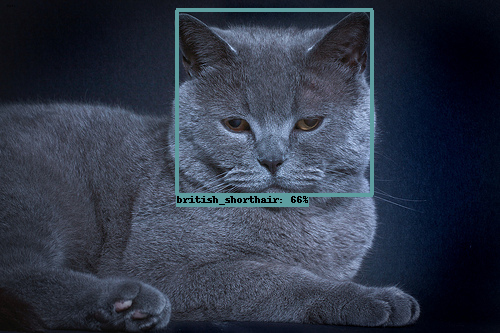

In [ ]:
path = TEST_IMAGE_PATHS[np.random.randint(0, len(TEST_IMAGE_PATHS))]
#Run inference over the image and display the results
show_inference(detection_model, path)

Running inference for /content/workspace/images/test/japanese_chin_155.jpg... Done !


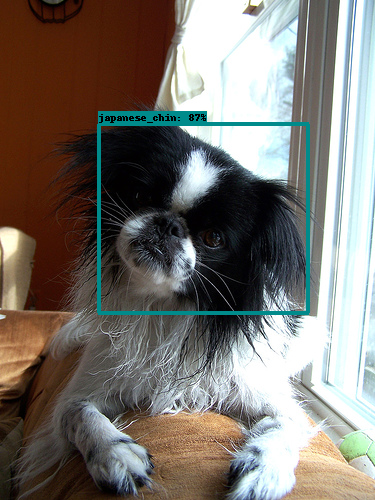

In [ ]:
path = TEST_IMAGE_PATHS[np.random.randint(0, len(TEST_IMAGE_PATHS))]
#Run inference over the image and display the results
show_inference(detection_model, path)

Running inference for /content/workspace/images/test/British_Shorthair_273.jpg... Done !


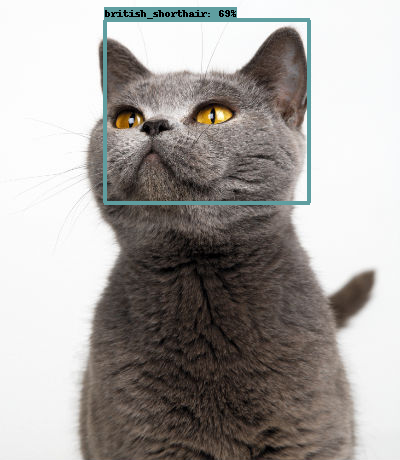

In [ ]:
path = TEST_IMAGE_PATHS[np.random.randint(0, len(TEST_IMAGE_PATHS))]
#Run inference over the image and display the results
show_inference(detection_model, path)

Running inference for /content/workspace/images/test/pomeranian_43.jpg... Done !


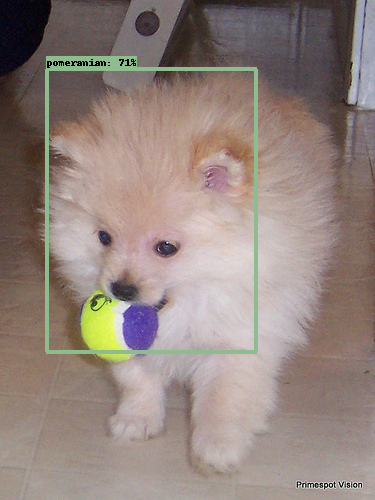

In [ ]:
path = TEST_IMAGE_PATHS[np.random.randint(0, len(TEST_IMAGE_PATHS))]
#Run inference over the image and display the results
show_inference(detection_model, path)

In [ ]:
#use google colab to load in a random image from local machine
from google.colab import files

#Upload file
fname = files.upload()
fname = list(fname.keys())[0]

Saving 493478_poster_l.jpg to 493478_poster_l.jpg


Running inference for 493478_poster_l.jpg... Done !


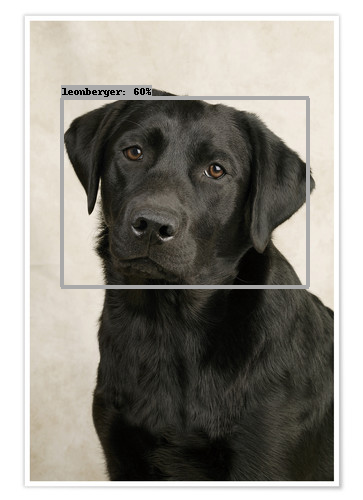

In [ ]:
show_inference(detection_model, fname)

Saving Labrador_Retriever_(1210559).jpg to Labrador_Retriever_(1210559).jpg
Running inference for Labrador_Retriever_(1210559).jpg... Done !


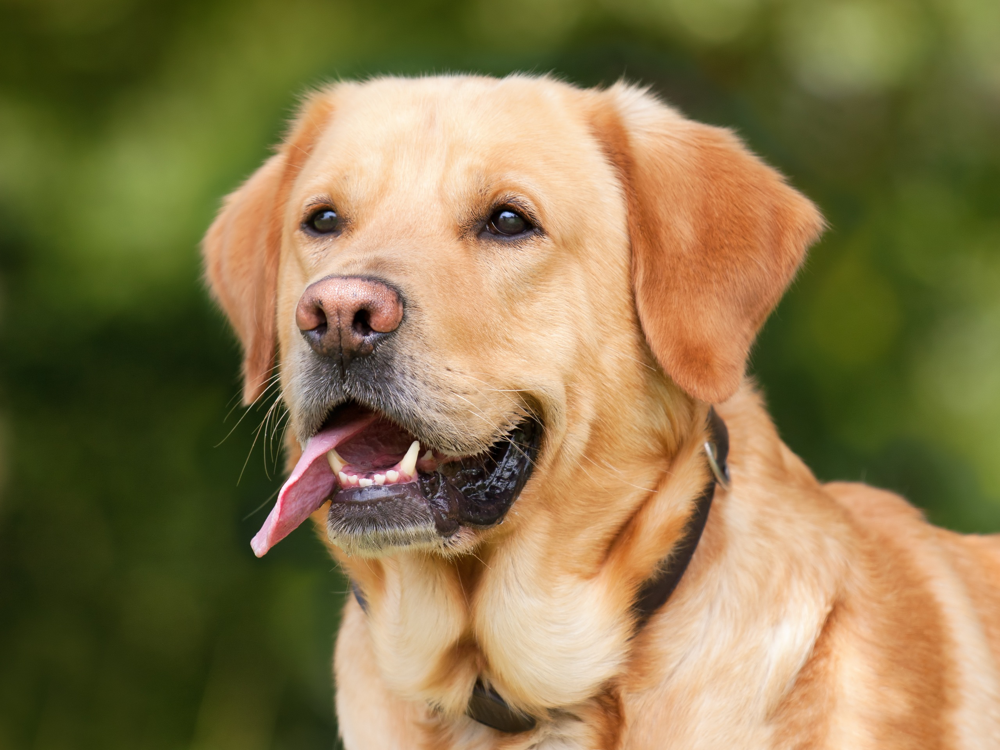

In [ ]:
#use google colab to load in a random image from local machine
from google.colab import files

#Upload file
fname = files.upload()
fname = list(fname.keys())[0]
show_inference(detection_model, fname)

In [ ]:
#use google colab to load in a random image from local machine
from google.colab import files

#Upload file
fname = files.upload()
fname = list(fname.keys())[0]

Saving BREED Hero Mobile_0040_retriever_labrador.jpg to BREED Hero Mobile_0040_retriever_labrador (1).jpg


Running inference for BREED Hero Mobile_0040_retriever_labrador.jpg... Done !


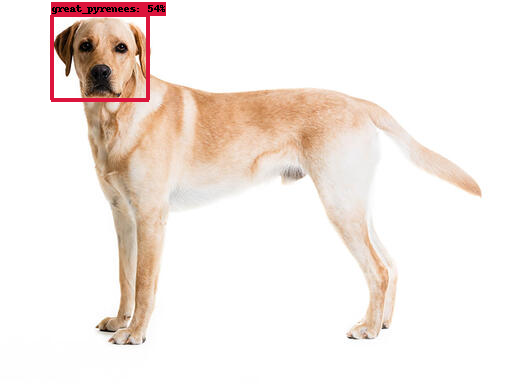

In [ ]:
show_inference(detection_model, fname)